<a href="https://colab.research.google.com/github/dcher95/universe7/blob/main/species/breedingbirdsurvey/eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!wget https://api.gbif.org/v1/occurrence/download/request/0116573-240626123714530.zip -O /content/0116573-240626123714530.zip

--2024-09-07 00:52:36--  https://api.gbif.org/v1/occurrence/download/request/0116573-240626123714530.zip
Resolving api.gbif.org (api.gbif.org)... 130.225.43.2
Connecting to api.gbif.org (api.gbif.org)|130.225.43.2|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://occurrence-download.gbif.org/occurrence/download/request/0116573-240626123714530.zip [following]
--2024-09-07 00:52:37--  https://occurrence-download.gbif.org/occurrence/download/request/0116573-240626123714530.zip
Resolving occurrence-download.gbif.org (occurrence-download.gbif.org)... 130.225.43.36
Connecting to occurrence-download.gbif.org (occurrence-download.gbif.org)|130.225.43.36|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9438684 (9.0M) [application/octet-stream]
Saving to: ‘/content/0116573-240626123714530.zip’

/content/0116573-24 100%[===================>]   9.00M  7.86MB/s    in 1.1s    

2024-09-07 00:52:39 (7.86 MB/s) - ‘/content/0116573-240626123

In [ ]:
import zipfile
import pandas as pd

In [ ]:
with zipfile.ZipFile("/content/0116573-240626123714530.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/MO-herbarium")  # Specify the extraction path

In [ ]:
# images of plants in MO
images = pd.read_csv("/content/MO-herbarium/multimedia.txt", sep="\t")
images = images[['gbifID', 'identifier', # IDs
                 'creator', 'license', 'rightsHolder']] # license stuff
images.head()

,gbifID,identifier,creator,license,rightsHolder
0,4058657016,http://sweetgum.nybg.org/images3/4081/461/0266...,The New York Botanical Garden,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden
1,4029520600,http://sweetgum.nybg.org/images3/4007/585/0428...,The New York Botanical Garden,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden
2,4029518536,http://sweetgum.nybg.org/images3/4007/584/0428...,The New York Botanical Garden,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden
3,3991079432,http://sweetgum.nybg.org/images3/4001/895/0430...,The New York Botanical Garden,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden
4,3898411703,http://sweetgum.nybg.org/images3/3997/615/0444...,The New York Botanical Garden,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden


In [ ]:
# example url
images['identifier'][3]

'http://sweetgum.nybg.org/images3/4001/895/04305565.jpg'

In [ ]:
# location information & occurrence info
occ = pd.read_csv("/content/MO-herbarium/occurrence.txt", sep="\t")
occ = occ[[
    'gbifID', 'occurrenceID', # Joining Keys
    'speciesKey', 'species', # species
    'year', 'month', 'day', # date
    'habitat', 'locality', # descriptive text. I think this is most of the route / habitat info we would want. Looks like already OCR processed?
    'countryCode', 'stateProvince', 'county', 'municipality', # administrative
    'georeferenceSources','hasCoordinate', 'hasGeospatialIssues' ,'decimalLatitude', 'decimalLongitude']] # geospatial
    # 'level0Gid', 'level0Name', 'level1Gid', 'level1Name', 'level2Gid', 'level2Name', 'level3Gid', 'level3Name',]] # Has NAs. Above is more reliable.

<ipython-input-6-2fba8c4880f6>:2: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  occ = pd.read_csv("/content/MO-herbarium/occurrence.txt", sep="\t")


In [ ]:
occ['hasCoordinate'].value_counts()

,count
hasCoordinate,
True,17486
False,6184


In [ ]:
# lot of occurrences don't have pictures. Can we still use those for the species map?
merged = images.merge(occ, on = ['gbifID'])
merged.head()

,gbifID,identifier,creator,license,rightsHolder,occurrenceID,speciesKey,species,year,month,...,locality,countryCode,stateProvince,county,municipality,georeferenceSources,hasCoordinate,hasGeospatialIssues,decimalLatitude,decimalLongitude
0,4058657016,http://sweetgum.nybg.org/images3/4081/461/0266...,The New York Botanical Garden,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden,729f51ea-b7cf-4341-8e0c-6284600e55c4,5270698.0,Chara contraria,2021.0,6.0,...,"Quartz, northeast bay, 50 meters southeast of ...",US,Missouri,Lewis Co.,NaN,Label,True,False,40.00345,-91.51426
1,4029520600,http://sweetgum.nybg.org/images3/4007/585/0428...,The New York Botanical Garden,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden,417b0467-2280-41f9-909c-548a49d9f9aa,8626275.0,Lecania cuprea,1990.0,9.0,...,"Ozark national Scenic Riverways, Big Spring ar...",US,Missouri,Carter Co.,NaN,NaN,True,False,36.95000,-90.99170
2,4029518536,http://sweetgum.nybg.org/images3/4007/584/0428...,The New York Botanical Garden,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden,396d53fa-3745-48b5-8c69-9f478288a44d,8626275.0,Lecania cuprea,1997.0,4.0,...,"Mark Twain National Forest, Hercules Glades Wi...",US,Missouri,Taney Co.,NaN,Label,True,False,36.68000,-92.88000
3,3991079432,http://sweetgum.nybg.org/images3/4001/895/0430...,The New York Botanical Garden,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden,1153c35b-4969-49b4-94a3-6c8aa1fac794,7580553.0,Reichlingia zwackhii,1993.0,4.0,...,"Ella Alford property, a large wooded tract alo...",US,Missouri,Ozark Co.,NaN,Label,True,False,36.78000,-93.37000
4,3898411703,http://sweetgum.nybg.org/images3/3997/615/0444...,The New York Botanical Garden,http://creativecommons.org/licenses/by/4.0/,The New York Botanical Garden,3bf5692c-327d-4812-8b3d-0cbe1477915e,2601468.0,Pseudocyphellaria aurata,1894.0,12.0,...,Houston.,US,Missouri,Texas Co.,NaN,NaN,False,False,NaN,NaN


In [ ]:
merged[['identifier', 'decimalLatitude', 'decimalLongitude', 'habitat', 'locality']].values

array([['http://sweetgum.nybg.org/images3/4081/461/02667171.jpg',
        40.00345, -91.51426, nan,
        'Quartz, northeast bay, 50 meters southeast of walk-in access'],
       ['http://sweetgum.nybg.org/images3/4007/585/04286795.jpg', 36.95,
        -90.9917, 'moist limestone slope bluffs',
        'Ozark national Scenic Riverways, Big Spring area, along trail from Big Spring Lodge to Chub Hollow along Current River'],
       ['http://sweetgum.nybg.org/images3/4007/584/04286794.jpg', 36.68,
        -92.88, 'dry oak woods with cherty soils over Cotter dolomite',
        'Mark Twain National Forest, Hercules Glades Wilderness Area, from Hercules Tower off MO125 to Pole Hollow'],
       ...,
       ['http://sweetgum.nybg.org/images3/902/577/1770096.jpg', 38.125,
        -90.675, nan,
        '6.5 mi (10.5 km) W of DeSoto; Among woods on ridgetop, cherty substrate, above bluff near Big River, ca. 0.1 mi (0.16 km) NNE of its confluence with Parker Creek.'],
       ['http://sweetgum.nybg

In [ ]:
merged[merged['hasCoordinate'] == False][['identifier', 'decimalLatitude', 'decimalLongitude', 'habitat', 'locality']].values

array([['http://sweetgum.nybg.org/images3/3997/615/04440444.jpg', nan,
        nan, nan, 'Houston.'],
       ['http://sweetgum.nybg.org/images3/3819/007/04099472.jpg', nan,
        nan, nan, 'near Columbus'],
       ['http://sweetgum.nybg.org/images3/3533/924/04098528.jpg', nan,
        nan, nan, 'south of Princeton'],
       ...,
       ['http://sweetgum.nybg.org/images3/2682/347/01392926.jpg', nan,
        nan, 'Moist banks, upland prairie', "Near Knights's Station"],
       ['http://sweetgum.nybg.org/images3/1461/019/02298353.jpg', nan,
        nan, nan, 'Gray Summit.'],
       ['http://sweetgum.nybg.org/images3/1602/193/02451781.jpg', nan,
        nan, nan, 'Montier. Rocky woods.']], dtype=object)

In [ ]:
merged['locality'].values

array(['Quartz, northeast bay, 50 meters southeast of walk-in access',
       'Ozark national Scenic Riverways, Big Spring area, along trail from Big Spring Lodge to Chub Hollow along Current River',
       'Mark Twain National Forest, Hercules Glades Wilderness Area, from Hercules Tower off MO125 to Pole Hollow',
       ...,
       '6.5 mi (10.5 km) W of DeSoto; Among woods on ridgetop, cherty substrate, above bluff near Big River, ca. 0.1 mi (0.16 km) NNE of its confluence with Parker Creek.',
       'Hughes Mountain Conservation Area, E of CR 540, ca. ½ mi S of CR M, ca. 3 mi SW of Irondale',
       'Charleston'], dtype=object)

In [ ]:
# !pip install folium matplotlib mapclassify

In [ ]:
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point

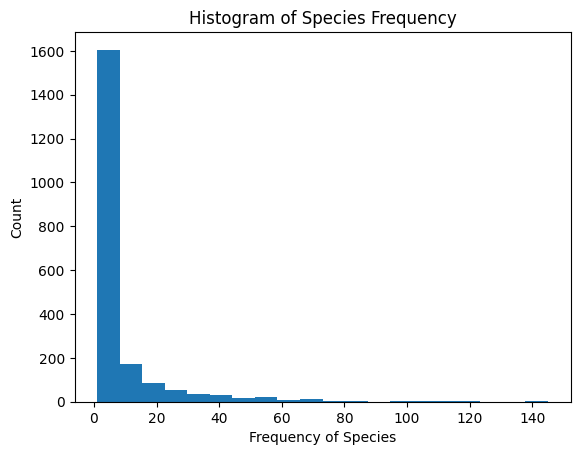

In [ ]:
ground_truth = occ[occ['hasCoordinate'] == True]
ground_truth['species'].value_counts().values
plt.hist(ground_truth['species'].value_counts().values, bins=20)
plt.xlabel('Frequency of Species')
plt.ylabel('Count')
plt.title('Histogram of Species Frequency')
plt.show()

In [ ]:
# Convert latitude and longitude into Point geometries
geometry = [Point(xy) for xy in zip(ground_truth['decimalLongitude'], ground_truth['decimalLatitude'])]

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(ground_truth, geometry=geometry)

# Optionally, set the coordinate reference system (CRS) to WGS84 (EPSG:4326)
gdf.set_crs(epsg=4326, inplace=True)

m = gdf.explore(
    color="blue",
)
m
# # Plot the points on a map
# gdf.plot(marker='o', color='red', markersize=5)
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')
# plt.title('Species Distribution Map')
# plt.show()


In [ ]:
m

# TODO
Basic geo-localization using textual query (Sat2Cap + SDM)
1.   Zero-shot query of Sat2Cap using habitat and locality information -> satellite image w/ heatmaps
2.   Query St. Louis SDM API to get a species distribution map -> satellite image w/ heatmaps
3.   Overlap and take the mean coordinate. If separate overlappings, take one with greatest overlap.

Future work -- refined search in overlappings?

